# working with C2L outputs, Loading and working with processed Visium data fetal

In [1]:
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
import pickle as pkl
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import re
import os
import scipy.stats
from numpy import asarray as ar
from collections import Counter
import imagespot_rev_v1 as ims
# import scvi

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100

from datetime import date
today = str(date.today())
sc.settings.verbosity = 1
sc.logging.print_version_and_date()
%load_ext autoreload
%autoreload 2

Running Scanpy 1.9.1, on 2024-09-05 10:52.


In [2]:
## For correct plotting of the images
from matplotlib import font_manager
font_manager.fontManager.addfont("")
# print(font_manager.findfont("Arial"))
plt.rcParams["font.sans-serif"] = ["Arial"]
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')

In [3]:
# output folder 
import os
os.chdir('')
# os.getcwd()

In [4]:
# load raw unified object 
adata_fet_all = sc.read_h5ad('')
del adata_fet_all.obs['cma_v1'] # remove old axis 
# adata_fet_all

# QC 

In [5]:
# filter spots by coverage
adata_fet_filt = adata_fet_all.copy()
sc.pp.filter_genes(adata_fet_filt,min_counts=2) # retain at least 3 levels of expression 0,1,2
adata_fet_filt.layers['counts'] = adata_fet_filt.X
adata_fet_filt = adata_fet_filt[adata_fet_filt.obs['tot_cell_abundance']>25,:].copy()
adata_fet_filt = adata_fet_filt[adata_fet_filt.obs['n_genes_by_counts']>1000,:]
adata_fet_filt = adata_fet_filt[adata_fet_filt.obs['annotations_level_0']!='Artifacts']
adata_fet_filt = adata_fet_filt[adata_fet_filt.obs['annotations_level_0']!='Background']
adata_fet_filt = adata_fet_filt[adata_fet_filt.obs['annotations_level_0']!='Unassigned']
adata_fet_filt = adata_fet_filt[~adata_fet_filt.obs['annotations_level_0'].isna()]
adata_fet_filt.obs['annotations_level_1'] = adata_fet_filt.obs['annotations_level_1'].astype('object')
adata_fet_filt.obs.loc[adata_fet_filt.obs['annotations_level_1']=='HS','annotations_level_1'] = 'HC'
adata_fet_filt.obs['annotations_level_1'] = adata_fet_filt.obs['annotations_level_1'].astype('category')

del adata_fet_all
# adata_fet_filt

# fix colors

In [6]:
htsa_colors = pd.read_csv('')
htsa_colors = htsa_colors.append({'structure': 'Fat', 'color_names': 'Cyclamen', 'color_map': '#ff6699'}, ignore_index=True)
htsa_colors = htsa_colors.set_index('structure')
htsa_colors

# map the colors to the categories
categories = adata_fet_filt.obs['annotations_level_0'].cat.categories
colors = []
for cat in categories:
    try:
        colors.append(htsa_colors['color_map'][cat])
    except KeyError:  # cat is not found in colors_dict
        colors.append('gray')  # use a default color

# assign the colors
adata_fet_filt.uns['annotations_level_0_colors'] = colors

# map the colors to the categories
categories = adata_fet_filt.obs['annotations_level_1'].cat.categories

colors = []
for cat in categories:
    try:
        colors.append(htsa_colors['color_map'][cat])
    except KeyError:  # cat is not found in colors_dict
        colors.append('gray')  # use a default color

# assign the colors
adata_fet_filt.uns['annotations_level_1_colors'] = colors

,color_names,color_map
structure,,
Artifacts,Cyclamen,#ff6699
lymph,Dark grey,#505050
Medulla,Orange peel,#ff9900
Edge,Duke blue,#330099
Cortex,Blue Green,#0099cc
HC,Forest green,#009900
PVS,Mauveine,#990099
vessels,Yellow,#ffff00
Fat,Cyclamen,#ff6699


# plot individual sample composition in umap and PCA space 

In [7]:
sc.set_figure_params(figsize=[4,4],fontsize=10,dpi=100)
for s in np.unique(adata_fet_filt.obs['SampleID']):
    adata = adata_fet_filt[adata_fet_filt.obs['SampleID']==s].copy()
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
#     sc.pl.umap(adata, color = ['cma_v2','annotations_level_0','annotations_level_1']
#            , title = s, frameon = False, cmap = 'gist_rainbow',save='_fet_sample_id'+s+'_v2.pdf',s=40,vmin=-0.8,vmax=0.8)
    

In [7]:
sc.set_figure_params(figsize=[4,4],fontsize=10,dpi=100)

cumul_pca = {}
for s in np.unique(adata_fet_filt.obs['SampleID']):
    adata = adata_fet_filt[adata_fet_filt.obs['SampleID']==s].copy()
    adata = adata[adata.obs['annotations_level_0']!='lymph'] # remove lymph for CMA correlations 
    sc.pp.normalize_per_cell(adata)
    sc.pp.log1p(adata)
    sc.pp.pca(adata)
#     sc.pl.pca(adata, color = ['cma_v2','annotations_level_0','annotations_level_1']
#            , title = s, frameon = False, cmap = 'gist_rainbow',s=40,vmin=-0.8,vmax=0.8,save='_fet_sample_id'+s+'_v2.pdf')
#      sc.pl.pca(adata, color = ['cma_v2','annotations_level_0','annotations_level_1']
#            , title = s, frameon = False, cmap = 'gist_rainbow',save='_fet_sample_id'+s+'.pdf',s=40,vmin=-0.8,vmax=0.8)
    cumul_pca[s] = ims.cumulative_pca(adata,obs='cma_v2',ncomps=10)

<BarContainer object of 12 artists>

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

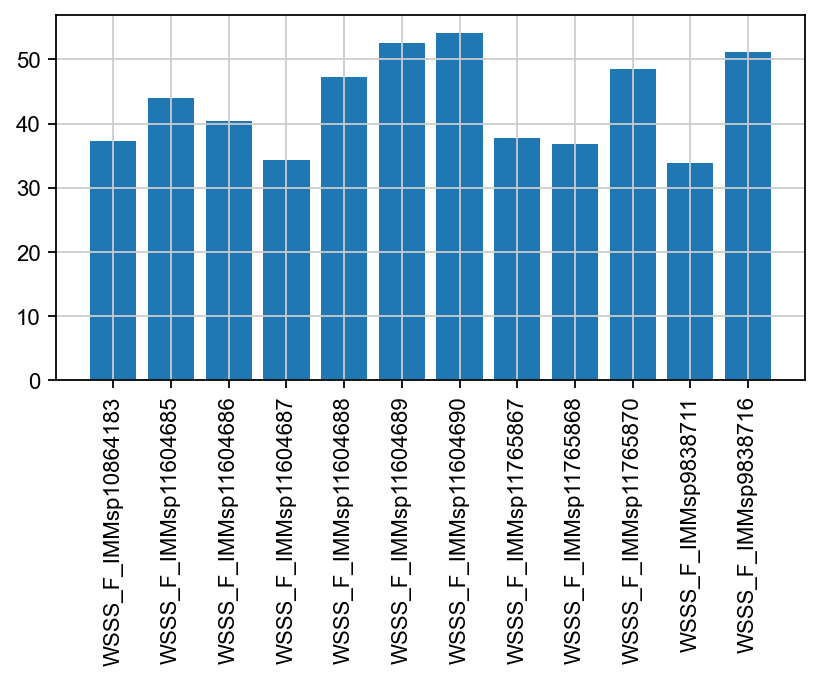

In [9]:
df = pd.DataFrame(cumul_pca)
plt.bar(df.keys(),height= df.sum()/10,width=0.8)
plt.xticks(rotation=90)

<BarContainer object of 12 artists>

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

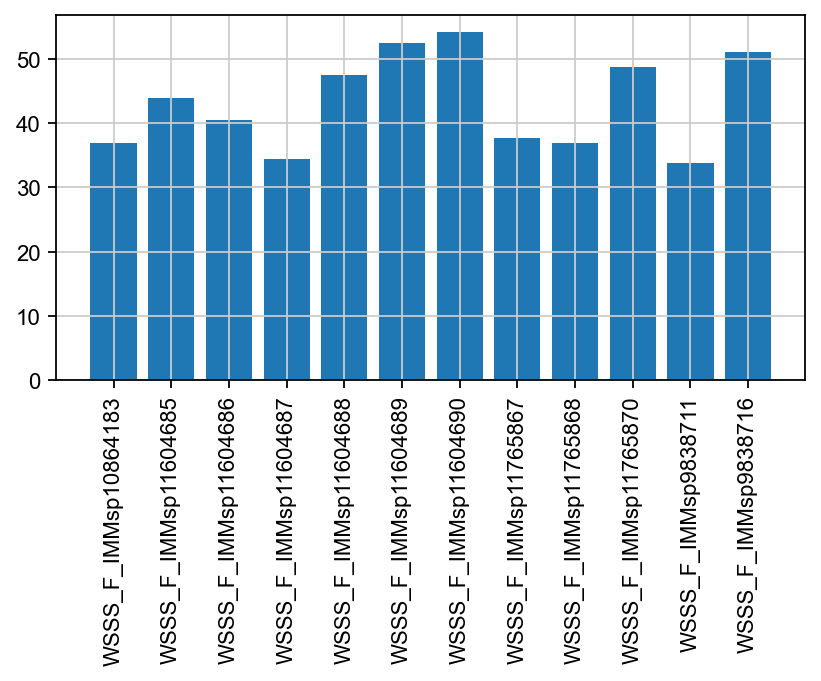

In [9]:
df = pd.DataFrame(cumul_pca)
plt.bar(df.keys(),height= df.sum()/10,width=0.8)
plt.xticks(rotation=90)

<Figure size 960x640 with 0 Axes>

<BarContainer object of 12 artists>

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

Text(0.5, 0, 'Sample ID | Age (months) | Donor ID')

Text(0, 0.5, 'Average Metric')

Text(0.5, 1.0, 'Sample Variability by Age and Donor')

(0.0, 60.0)

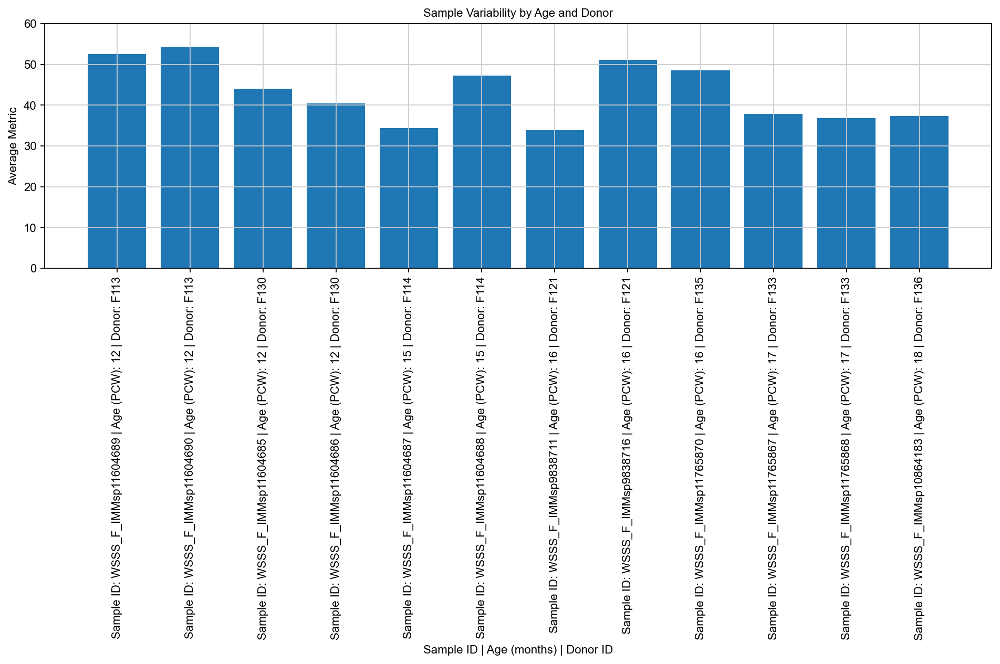

In [10]:
# Convert cumul_pca to a DataFrame, calculate the metric
sample_info = adata_fet_filt.obs[['SampleID', 'Age(numeric)', 'DonorID']].drop_duplicates().set_index('SampleID')

df_pca = pd.DataFrame(cumul_pca).T  # Transpose to have samples as rows
df_pca['Metric'] = df_pca.sum(axis=1) / 10  # Calculate the sum or average of your metrics for each sample

# Merge the PCA metrics with the sample information
df_merged = df_pca.merge(sample_info, left_index=True, right_index=True)
df_sorted = df_merged.sort_values(by=['Age(numeric)', 'DonorID'])
df_sorted.index = df_sorted.index.astype(str)

df_sorted['Age(numeric)'] = (df_sorted['Age(numeric)']+40).astype(str)
df_sorted['DonorID'] = df_sorted['DonorID'].astype(str)

df_sorted['PlotLabel'] = 'Sample ID: '+ df_sorted.index + ' | Age (PCW): ' + df_sorted['Age(numeric)'] + ' | Donor: ' + df_sorted['DonorID']

plt.figure(figsize=(12, 8))
plt.bar(df_sorted['PlotLabel'], height=df_sorted['Metric'])
plt.xticks(rotation=90)
plt.xlabel('Sample ID | Age (months) | Donor ID')
plt.ylabel('Average Metric')
plt.title('Sample Variability by Age and Donor')
plt.tight_layout()
plt.ylim(0,60)

plt.savefig('figures/PCA_fetal_sample_variability_plot_v2.pdf')


plt.show()


In [11]:
df_sorted.to_csv('')

# HVG selection 

In [12]:
adata_tmp = adata_fet_filt.copy()
cc_genes =  ['C1orf112', 'KDM1A', 'ARHGAP33', 'CDC27', 'AC004381.6', 'DBF4', 'PRSS21', 'E2F2', 'BAZ1B', 'NCAPD2', 'ANLN', 'BRCA1', 'UBR7', 'DDX11', 'TACC3', 'POLA2', 'DEPDC1', 'NCAPH2', 'HMGB3', 'CENPQ', 'DEPDC1B', 'SPDL1', 'TDP1', 'DSG2', 'NOP16', 'RFC2', 'RAD51', 'POLQ', 'THOC3', 'MRTO4', 'C4orf27', 'POLD1', 'TM7SF3', 'MCM10', 'MTHFD2', 'YBX1', 'ASPM', 'PRR11', 'NUCKS1', 'EXOC5', 'TCOF1', 'RAD18', 'TRIP13', 'DAZAP1', 'HLTF', 'PDCD2', 'SMC1A', 'HMMR', 'MCM2', 'NUP37', 'GTSE1', 'WDR62', 'MCM6', 'MLH1', 'UNG', 'SPAG5', 'UBE2T', 'EXOSC5', 'FAM76B', 'POLD3', 'KIF22', 'PUM3', 'RBL1', 'NDC80', 'HSPB11', 'OXCT1', 'SEH1L', 'ORC1', 'RAD54L', 'NOP14', 'GMCL1', 'AURKA', 'TPX2', 'BIRC5', 'KIF4A', 'FH', 'ORC6', 'G2E3', 'WDR76', 'PHGDH', 'CLSPN', 'NUP50', 'CDC45', 'CDC6', 'CBX5', 'MSH2', 'FKBP5', 'ACOT7', 'CDC7', 'RANBP1', 'CENPM', 'HMGXB4', 'MCM5', 'RANGAP1', 'POLE2', 'CDKN3', 'ERH', 'MTHFD1', 'VRK1', 'EMC9', 'GINS1', 'MYBL2', 'CDC25B', 'PLCB4', 'FAM83D', 'CEP76', 'RBBP8', 'POLA1', 'NUP93', 'CTCF', 'CCP110', 'CEP152', 'OIP5', 'MYEF2', 'MCM4', 'KCTD9', 'RNASEH2A', 'SGTA', 'ASF1B', 'LIG1', 'H2AFV', 'GARS', 'NUDT1', 'RPA3', 'EZH2', 'RHEB', 'SMC3', 'UBE2S', 'RAD51C', 'GALK1', 'C1QBP', 'BLMH', 'TMEM97', 'GAR1', 'NEIL3', 'WHSC1', 'NCAPG', 'CCDC34', 'CCDC86', 'MAGOHB', 'FOXM1', 'GPN3', 'RAD51AP1', 'RFC5', 'NUP107', 'TIMELESS', 'GAPDH', 'CDCA3', 'ENO2', 'FBXO5', 'MCM3', 'BAG2', 'GMNN', 'TTK', 'HMGCS1', 'BRD8', 'KIF20A', 'LMNB1', 'NUP155', 'H2AFY', 'SMC4', 'ECT2', 'CENPA', 'FHL2', 'MSH6', 'DHCR24', 'LRRC42', 'WDR77', 'SRM', 'MAD2L2', 'UCHL5', 'TTF2', 'SLC2A1', 'EBNA1BP2', 'CDC20', 'STMN1', 'NEK2', 'CENPF', 'KIF14', 'CASP8AP2', 'CTNNAL1', 'WDR34', 'PHF19', 'ACYP1', 'EPCAM', 'HELLS', 'CENPL', 'ACAT2', 'MASTL', 'EXOSC8', 'TMPO', 'NFYB', 'NCAPH', 'MND1', 'KIF18A', 'GPSM2', 'GTF3A', 'MRPS2', 'CCDC18', 'CISD1', 'ZWINT', 'CIT', 'DDX39A', 'CENPK', 'CDK2', 'TUBA1B', 'STIL', 'HJURP', 'EXOSC9', 'CKS2', 'ACSL3', 'CSE1L', 'HIST1H1D', 'HIST1H1A', 'DEK', 'GOT2', 'MGME1', 'MCM8', 'HNRNPR', 'BCL2L12', 'TRAP1', 'DLGAP5', 'YEATS4', 'PKMYT1', 'SRD5A3', 'PAICS', 'HAT1', 'KNSTRN', 'DUT', 'E2F8', 'FAM64A', 'MIS18BP1', 'SGOL1', 'RPS4Y1', 'LDLR', 'TOMM40', 'ATP8B3', 'LSM4', 'DNMT1', 'GINS2', 'TUBG1', 'PSMC3IP', 'THOC6', 'TOP2A', 'ENOSF1', 'RAN', 'RPA1', 'PCNA', 'NASP', 'RFC3', 'SLF1', 'LRRCC1', 'CCNB1', 'PSRC1', 'TMEM106C', 'LDHA', 'DDB2', 'CDCA8', 'TPGS2', 'SLC43A3', 'C9orf40', 'TROAP', 'ESPL1', 'NTPCR', 'CKAP2', 'BORA', 'NUDT15', 'BRIP1', 'ACTL6A', 'TXN', 'ODF2', 'SMC2', 'CDK5RAP2', 'ANP32B', 'DSCC1', 'ARHGEF39', 'PPIL1', 'TCF19', 'NRM', 'GGH', 'BUD13', 'CTDSPL2', 'NUSAP1', 'KIF23', 'CASC5', 'CENPO', 'KIF11', 'CEP55', 'KIF20B', 'DNA2', 'BARD1', 'MNS1', 'ZGRF1', 'CENPE', 'HADH', 'SLC39A8', 'NEDD1', 'BRCA2', 'DIAPH3', 'PIF1', 'FANCI', 'TICRR', 'SAMD1', 'SAE1', 'PLK4', 'ITGB3BP', 'KIF2C', 'UCK2', 'NUF2', 'ANP32E', 'DTL', 'ILF2', 'C1orf35', 'HNRNPLL', 'CHAC2', 'POLR2D', 'CDCA7', 'FANCD2', 'CCNA2', 'SKP2', 'PRIM2', 'MMS22L', 'PM20D2', 'MTFR2', 'CDCA5', 'NCAPG2', 'PRPS1', 'GINS4', 'HAUS6', 'CEP78', 'GTF3C5', 'MKI67', 'IMMP1L', 'SSRP1', 'INCENP', 'CCDC15', 'CHEK1', 'DSN1', 'HIRIP3', 'HMGA2', 'TEX30', 'NCAPD3', 'CENPU', 'CENPJ', 'SPC25', 'SUV39H2', 'CENPH', 'CARHSP1', 'CLGN', 'CCSAP', 'BUB3', 'SLFN13', 'SKA1', 'SLC16A1', 'TMEM237', 'ADK', 'FAM122B', 'AIFM1', 'ATAD2', 'SASS6', 'BUB1B', 'CCNB2', 'PSMG3', 'FAIM', 'CDC25C', 'MIS18A', 'ATP5G1', 'IGF2BP1', 'CHAF1B', 'NAE1', 'CCDC58', 'C21orf58', 'ZNF714', 'GPATCH4', 'YDJC', 'RACGAP1', 'SPC24', 'POLR3K', 'CCNF', 'ASRGL1', 'USP1', 'KIAA1524', 'SGOL2', 'TOPBP1', 'KIF15', 'WDR43', 'RFC4', 'RPL39L', 'RNF168', 'H2AFZ', 'CDC25A', 'POC1A', 'HMGB2', 'MAD2L1', 'PTTG1', 'RAD21', 'PSIP1', 'GKAP1', 'MELK', 'SLC7A3', 'SKA3', 'LRR1', 'HPRT1', 'E2F7', 'JAM3', 'BRD7', 'CENPN', 'LEO1', 'WEE1', 'MCM7', 'CENPV', 'SAAL1', 'FAM111A', 'KIAA0101', 'PLK1', 'XRCC6BP1', 'SNRPD1', 'RRM1', 'CDT1', 'CHAF1A', 'C19orf48', 'NUDT8', 'PRDX2', 'TK1', 'SAC3D1', 'PBK', 'HIST1H1E', 'DTYMK', 'RFWD3', 'FEN1', 'ING2', 'CDKN2AIP', 'SNRNP48', 'USP39', 'CKAP2L', 'BUB1', 'ELP5', 'CDK1', 'CDCA4', 'SHCBP1', 'PGAM1', 'ESCO2', 'RHNO1', 'CTPS1', 'RRM2', 'THOP1', 'C5orf34', 'POP7', 'ZNF738', 'CKS1B', 'GMPPB', 'CNP', 'CBX2', 'C16orf91', 'EXO1', 'ZWILCH', 'ANKRD36C', 'UBE2C', 'CKAP5', 'CCNE2', 'CCDC14', 'RMI2', 'TOMM5', 'RUVBL1', 'ATAD5', 'LMNB2', 'TYMS', 'PXMP2', 'SHMT1', 'POLE', 'PAWR', 'PIDD1', 'GSG2', 'GEN1', 'RMI1', 'AURKB', 'RCC1', 'PPA1', 'HIST3H2A', 'MRPS23', 'RTKN2', 'IDH2', 'KPNA2', 'CEP97', 'GLRX5', 'SKA2', 'CEP57L1', 'PSMG1', 'SFXN4', 'ALYREF', 'TRAIP', 'LIN9', 'KMT5A', 'PGP', 'CMSS1', 'HIST2H2AC', 'HIST1H1B', 'KNTC1', 'CDCA2', 'H1FX', 'SIVA1', 'PARPBP', 'KIF18B', 'ERCC6L', 'PTMA', 'HSPA14', 'FANCA', 'ARHGAP11B', 'TUBB4B', 'CENPP', 'H2AFX', 'FAM72B', 'FAM221A', 'FAM111B', 'HN1', 'HMGB1', 'TUBB', 'IARS', 'ERI2', 'HIST1H4C', 'BLM', 'PRIM1', 'HMGN5', 'SVIP', 'TFDP1', 'TXNRD1', 'WDHD1', 'EIF1AY', 'ARHGAP11A', 'HMGN2', 'DCAF12', 'PRC1', 'CCDC167', 'CENPW', 'GPANK1', 'MZT1', 'C4orf46', 'KLHL23', 'MXD3', 'DNAJC9', 'IFRD2', 'CKLF', 'FANCG', 'DHFR', 'DLEU2', 'AP000251.3', 'KIFC1', 'CRNDE', 'C8orf88', 'PRKDC', 'BOP1', 'RP11-196G18.23', 'CTC-260E6.6', 'NCBP2-AS2', 'HIST1H3G', 'HIST1H2AH', 'UHRF1', 'RDM1', 'HIST1H2AM']
def remove_selected_genes(adata,lst,remove_also_mt=True):
    for g in lst:
        adata = adata[:,~(adata.var_names==g)]
    if remove_also_mt:
        adata = adata[:,~(adata.var_names.str.startswith('MT-'))]
    return adata

adata_tmp = remove_selected_genes(adata_tmp,cc_genes,remove_also_mt=True)  

sc.pp.highly_variable_genes(
        adata_tmp,
        n_top_genes=3500,
        subset=True,
        layer='counts',
        flavor="seurat_v3",
        batch_key='SampleID',
        span=1,
    )
import re

for i in adata_tmp.var.index:
    if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
        adata_tmp.var.at[i, 'highly_variable'] = False
adata_tmp = adata_tmp[:,adata_tmp.var.highly_variable]
    

# SCVI 

In [13]:
adata_tmp = adata_tmp.copy()
import warnings
warnings.filterwarnings('once')
scvi.model.SCVI.setup_anndata(adata_tmp, batch_key='DonorID', \
                        categorical_covariate_keys=['SlideID','Spaceranger','section_thickness (um)'],continuous_covariate_keys=['Age(numeric)','n_genes_by_counts'])
vae = scvi.model.SCVI(adata_tmp,n_layers=2, n_latent=30)
vae.train(max_epochs=300,batch_size=2000)
adata_fet_filt.obsm["X_scVI"] = vae.get_latent_representation() # return batch corrections to original anndata

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/torch/cuda/__init__.py:145: UserWarning: 
NVIDIA A100-SXM4-80GB with CUDA capability sm_80 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 compute_37.
If you want to use the NVIDIA A100-SXM4-80GB GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/trainer/trainer.py:1892: PossibleUserWarning: The number of training batches (6) is smaller than the logging interval Trainer(log_e

Epoch 300/300: 100%|████████████████████████████████████████████| 300/300 [02:09<00:00,  8.85it/s, loss=1.27e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 300/300: 100%|████████████████████████████████████████████| 300/300 [02:09<00:00,  2.32it/s, loss=1.27e+03, v_num=1]


In [14]:
sc.pp.neighbors(adata_fet_filt, use_rep="X_scVI",n_neighbors=5)

In [15]:
sc.tl.umap(adata_fet_filt, min_dist = 0.5, spread = 1,n_components=3)

In [16]:
os.chdir('')

In [17]:
adata_fet_filt.obs['annotations_level_1'] = adata_fet_filt.obs['annotations_level_1'].astype('object')
adata_fet_filt.obs.loc[adata_fet_filt.obs['annotations_level_1']=='HS','annotations_level_1'] = 'HC'
adata_fet_filt.obs['annotations_level_1'] = adata_fet_filt.obs['annotations_level_1'].astype('category')

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:444: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)


/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:444: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)


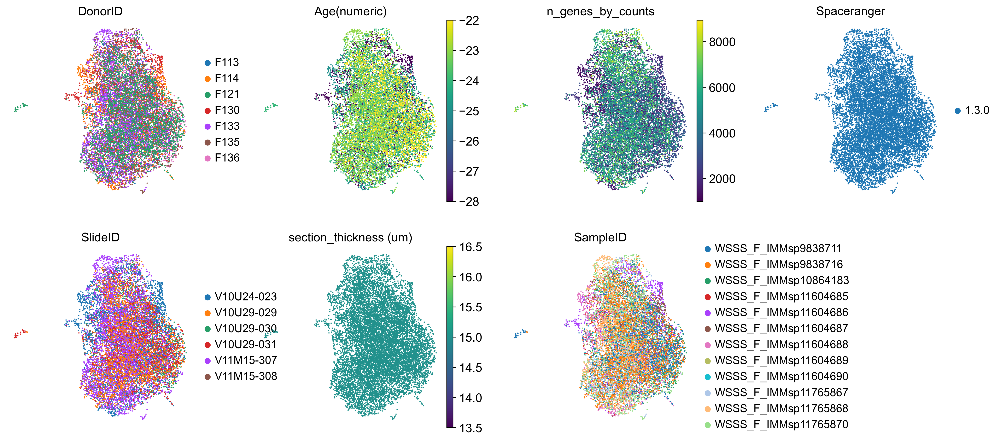

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


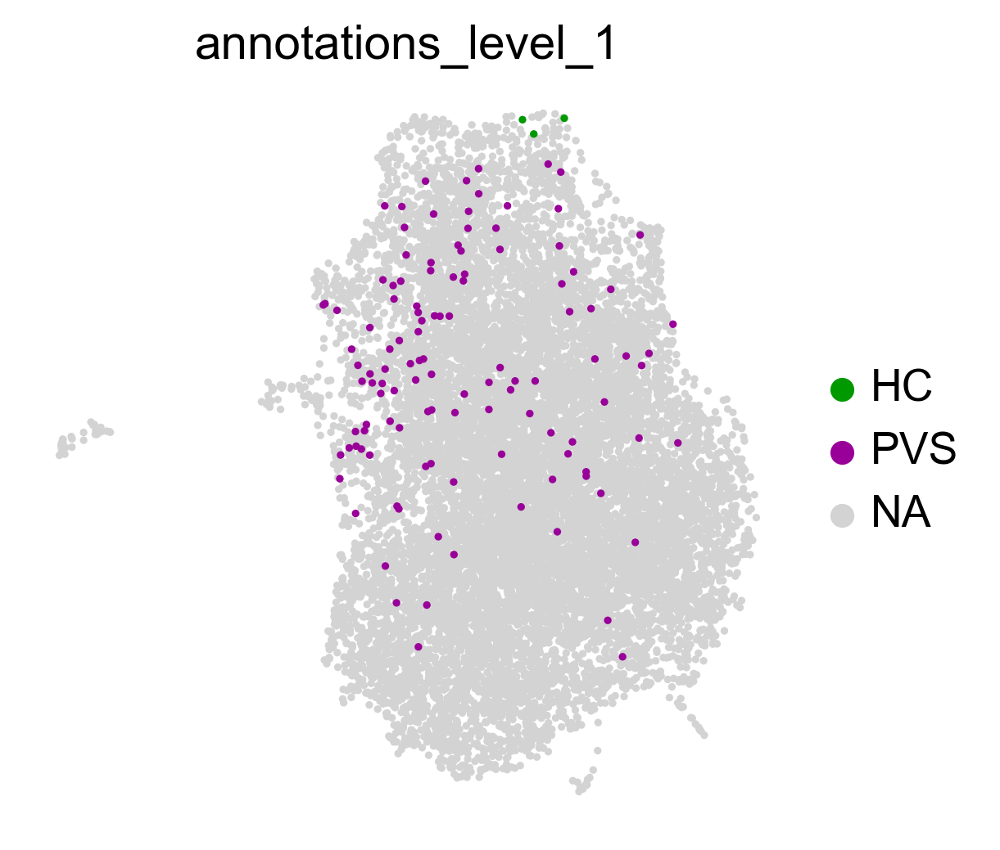

In [18]:
sc.set_figure_params(figsize=[5,5],fontsize=10,dpi=150)
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'eps')
sc.pl.umap(adata_fet_filt, color = ['DonorID','Age(numeric)','n_genes_by_counts','Spaceranger','SlideID','section_thickness (um)','SampleID']
           , frameon = False, cmap = 'viridis',save='_fet_meta_data_v11.pdf')
sc.pl.umap(adata_fet_filt, color = ['annotations_level_1']
           , frameon = False, groups=['HC','PVS'],s=20,save='_fet_annotations_level_1_v11.pdf')

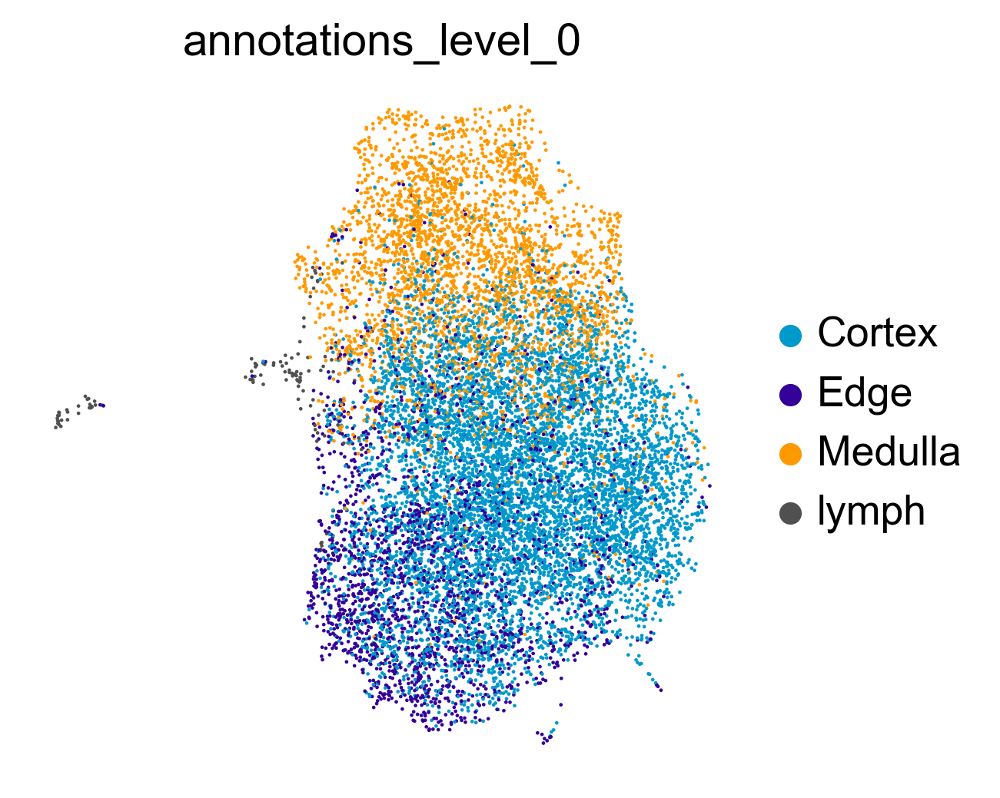

In [19]:
sc.pl.umap(adata_fet_filt, color = ['annotations_level_0']
           , frameon = False,s=5,save='_fet_annotations_level_0_v11.pdf')

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:444: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)


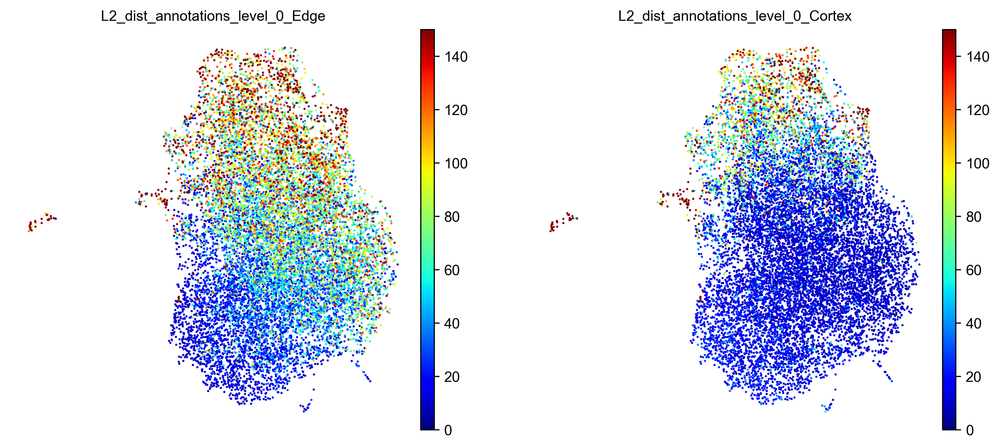

In [20]:
sc.set_figure_params(figsize=[5,5],fontsize=10,dpi=150)
sc.pl.umap(adata_fet_filt, color = ['L2_dist_annotations_level_0_Edge','L2_dist_annotations_level_0_Cortex'] # need to correct by multiplying by 2 to get to pixels 
           , frameon = False, cmap = 'jet',vmin=0,vmax=150,save='_fet_dist_edge_cortex_300_v11.pdf')

In [21]:
sc.set_figure_params(figsize=[5,5],fontsize=10,dpi=150)
# sc.pl.umap(adata_fet_filt, color = ['cma_v2'],s=10, frameon = False, cmap = 'gist_rainbow',save='_fet_cma_v2_v11.pdf',vmin=-0.8,vmax=0.8)
# adata_fet_filt

In [22]:
adata_fet_filt.write_h5ad('')

# Analyse fet 

In [23]:
adata_fet_filt = sc.read_h5ad('')

In [24]:
adata_fet_filt.layers['counts'] = adata_fet_filt.X
adata_fet_filt
# make sure it's count data 
# list = ['CD34','NOTCH1','NOTCH2','NOTCH3',]
# sc.pl.violin(adata_fet_filt, keys =list,layer='counts')

In [25]:
# remove artifacts structures 
import warnings
warnings.filterwarnings('ignore')

adata_fet_cma = adata_fet_filt[adata_fet_filt.obs['annotations_level_0']!="lymph"].copy()
 
## remove meduala less lobules 
adata_fet_cma.obs['full_lobule'] = 0
for s in adata_fet_cma.obs['SampleID'].cat.categories.tolist():
    sample = adata_fet_cma[adata_fet_cma.obs['SampleID'].isin([s])]
    for l in sample.obs['annotations_lobules_0'].cat.categories:
        lobule = sample.obs['annotations_lobules_0'] == l
        med = np.where(sample.obs['annotations_level_0'][lobule] == 'Medulla')[0]
        cortex = np.where(sample.obs['annotations_level_0'][lobule] == 'Cortex')[0]
        if (cortex.size>=1) & (med.size>=1):
            adata_fet_cma.obs['full_lobule'][lobule.iloc[np.where(lobule)].index] = 1
adata_fet_cma.obs['full_lobule'] = adata_fet_cma.obs['full_lobule'].astype('category')
adata_fet_cma.obs['full_lobule'].value_counts()
adata_fet_cma = adata_fet_cma[adata_fet_cma.obs['full_lobule']==1] # remove spots that don't have either medullar or cortical data

sc.set_figure_params(figsize=[7,7],fontsize=20,dpi=100)
# sc.pl.umap(adata_fet_cma, color ='annotation_figure_1', frameon = False,s=5)

1    10090
0     2710
Name: full_lobule, dtype: int64

# correlations with axis 

In [26]:
# normalize 
sc.pp.normalize_total(adata_fet_cma,target_sum=2500)
sc.pp.log1p(adata_fet_cma)
# adata_fet_cma

In [27]:
# batch correction
sc.pp.combat(adata_fet_cma, key='SampleID', inplace=True)

Found 124 genes with zero variance.


In [28]:
# pca
sc.pp.pca(adata_fet_cma, n_comps = 10)

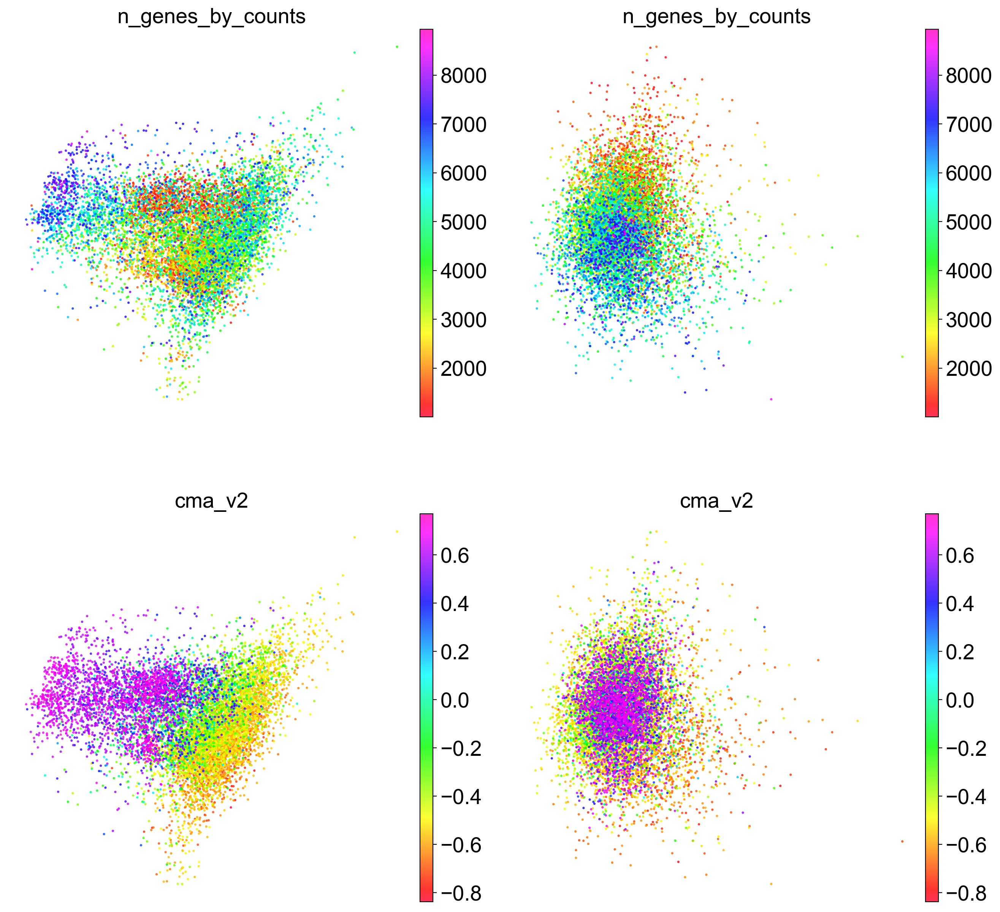

In [29]:
# plot pca 
sc.pl.pca(adata_fet_cma, components = ['1,2', '3,4'], color = ['n_genes_by_counts', 'cma_v2'], ncols = 2, cmap = "gist_rainbow",s=20,alpha=0.8,annotate_var_explained=True,frameon=False,save='_fet_pca_cma_counts_v11.pdf')

<BarContainer object of 10 artists>

<BarContainer object of 10 artists>

Text(0.5, 0, 'Number of PCs')

Text(0, 0.5, 'fet Cumulative Correlation as Percent of Cumulative Variance - cma')

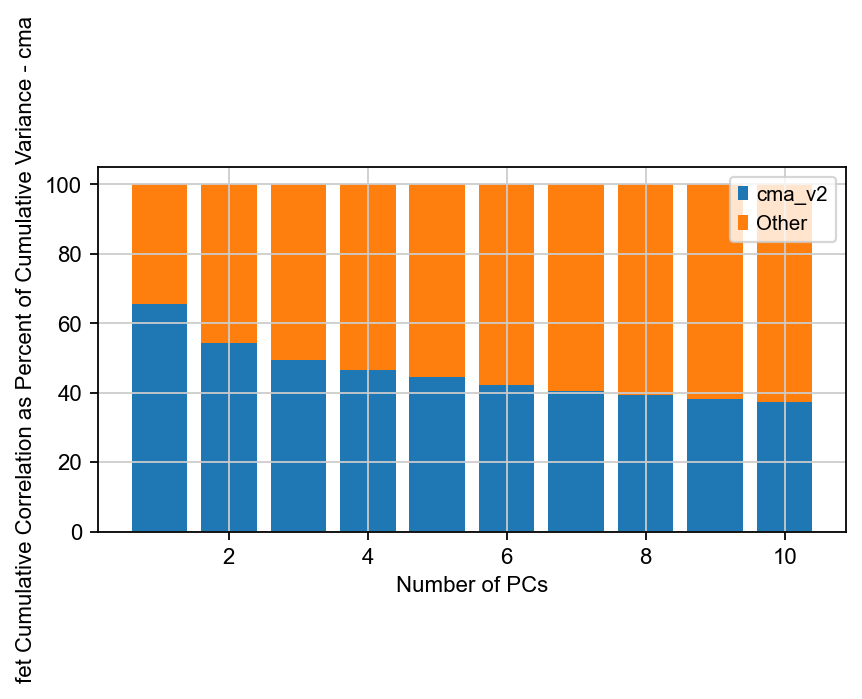

In [30]:
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

sc.set_figure_params(figsize=[6,3],fontsize=10)

# Define the observation name
obs_name1 = "cma_v2"  # replace with your observation name

# Get the values of the observation
obs_values1 = adata_fet_cma.obs[obs_name1]

# Initialize variables to store the cumulative correlation and variance
cumulative_corr1 = 0
cumulative_variance = 0

# Initialize lists to store cumulative correlation as percent of cumulative variance
cum_corr_pct1 = []

# Calculate correlation with each PC
for i in range(10):
    pc_values = adata_fet_cma.obsm['X_pca'][:, i]

    # Pearson correlation
    corr1, _ = spearmanr(obs_values1, pc_values)

    # Get variance explained by this PC
    explained_variance = adata_fet_cma.uns['pca']['variance_ratio'][i]

    # Add weighted correlation and variance to cumulative measures
    cumulative_corr1 += np.abs(corr1) * explained_variance
    cumulative_variance += explained_variance

    # Store cumulative correlation as percent of cumulative variance
    cum_corr_pct1.append(100*cumulative_corr1/cumulative_variance)

# Create a stacked bar plot
plt.bar(range(1, 11), cum_corr_pct1, label=obs_name1)
plt.bar(range(1, 11), [100 - pct for pct in cum_corr_pct1], bottom=cum_corr_pct1, label='Other')
plt.xlabel('Number of PCs')
plt.ylabel('fet Cumulative Correlation as Percent of Cumulative Variance - cma')
plt.legend()

# Save the plot
# plt.savefig('figures/fet_cumulative_correlation_plot_v11.pdf', dpi=300)

plt.show()


In [31]:
coor = dict()
coor['cma'] = cum_corr_pct1

<BarContainer object of 10 artists>

<BarContainer object of 10 artists>

Text(0.5, 0, 'Number of PCs')

Text(0, 0.5, ' pael=d Cumulative Correlation as Percent of Cumulative Variance')

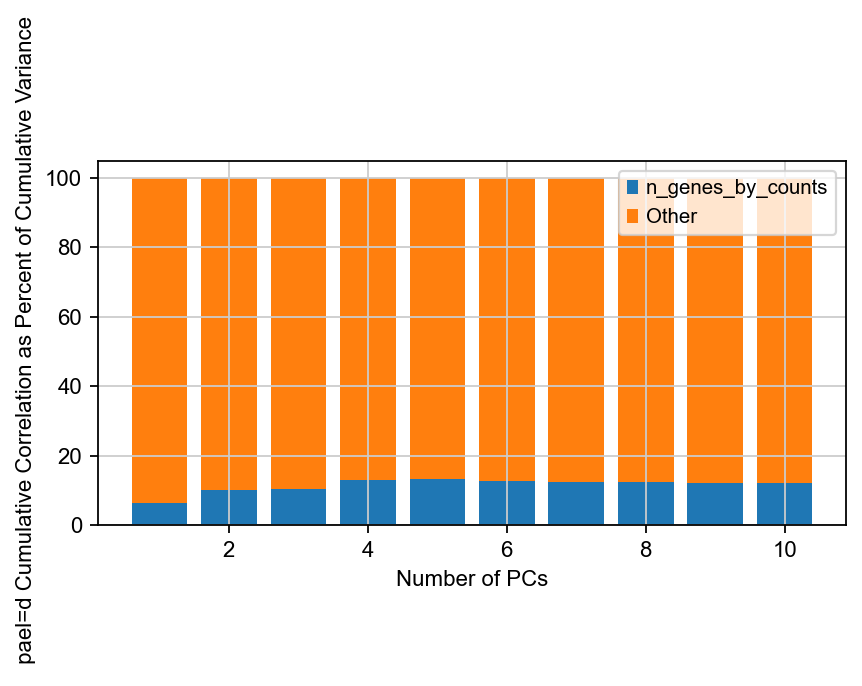

In [32]:
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

sc.set_figure_params(figsize=[6,3],fontsize=10)
# Define the observation name
obs_name1 = "n_genes_by_counts"  # replace with your observation name

# Get the values of the observation
obs_values1 = adata_fet_cma.obs[obs_name1]

# Initialize variables to store the cumulative correlation and variance
cumulative_corr1 = 0
cumulative_variance = 0

# Initialize lists to store cumulative correlation as percent of cumulative variance
cum_corr_pct1 = []

# Calculate correlation with each PC
for i in range(10):
    pc_values = adata_fet_cma.obsm['X_pca'][:, i]

    # Pearson correlation
    corr1, _ = spearmanr(obs_values1, pc_values)

    # Get variance explained by this PC
    explained_variance = adata_fet_cma.uns['pca']['variance_ratio'][i]

    # Add weighted correlation and variance to cumulative measures
    cumulative_corr1 += np.abs(corr1) * explained_variance
    cumulative_variance += explained_variance

    # Store cumulative correlation as percent of cumulative variance
    cum_corr_pct1.append(100*cumulative_corr1/cumulative_variance)

# Create a stacked bar plot
plt.bar(range(1, 11), cum_corr_pct1, label=obs_name1)
plt.bar(range(1, 11), [100 - pct for pct in cum_corr_pct1], bottom=cum_corr_pct1, label='Other')

plt.xlabel('Number of PCs')
plt.ylabel(' pael=d Cumulative Correlation as Percent of Cumulative Variance')
plt.legend()

# Save the plot
plt.savefig('', dpi=300)

plt.show()


In [33]:
coor['n_genes_by_counts'] = cum_corr_pct1
pd.DataFrame(coor).to_csv('')

In [34]:
adata_fet_cma.write_h5ad('')